## Week 5: GANs Kaggle: I’m Something of a Painter Myself

Project Topic: Train GANs to generate 7000 - 10000 Monet-Style images.

### 1. Import the necessary python libraries

In [1]:
import os
import zipfile
import glob
import time
import numpy as np
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt

2025-04-24 03:49:45.110693: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-24 03:49:45.139628: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-24 03:49:45.153530: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8473] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-24 03:49:45.157091: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1471] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-24 03:49:45.177171: I tensorflow/core/platform/cpu_feature_guar

This snippet tells TensorFlow to only grab GPU memory as it’s needed, instead of reserving all of it up front

In [2]:
for gpu in tf.config.list_physical_devices('GPU'):
    tf.config.experimental.set_memory_growth(gpu, True)

I0000 00:00:1745466587.929783    9150 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1745466588.392091    9150 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1745466588.392144    9150 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


Get the paths for JPGs and TIFs files.

In [3]:
monet_data_dir = os.path.join(os.getcwd(), "gan-getting-started")
monet_jpg_dir = os.path.join(monet_data_dir, "monet_jpg")
monet_tfrec_dir = os.path.join(monet_data_dir, "monet_tfrec")
photo_jpg_dir = os.path.join(monet_data_dir, "photo_jpg")
photo_tfrec_dir = os.path.join(monet_data_dir, "photo_tfrec")

### 2 Exploratory Data Analysis (EDA)

Prints the total number of Monet images, and the first 5 paths of the Monet images.

In [4]:
monet_jpgs = [os.path.join(monet_jpg_dir, jpg) for jpg in os.listdir(monet_jpg_dir)]

print(f"Total number of Monet images: {len(monet_jpgs)}")
print(f"First 5 images:\n{monet_jpgs[:5]}")

Total number of Monet images: 300
First 5 images:
['/workspace/gan-getting-started/monet_jpg/632ddbc784.jpg', '/workspace/gan-getting-started/monet_jpg/a8fbbe3eb1.jpg', '/workspace/gan-getting-started/monet_jpg/fdf1530d95.jpg', '/workspace/gan-getting-started/monet_jpg/7239ba0b55.jpg', '/workspace/gan-getting-started/monet_jpg/7341d96c1d.jpg']


Prints the total number of Photo images, and the first 5 paths of the Photo images.

In [5]:
photo_jpgs = [os.path.join(photo_jpg_dir, jpg) for jpg in os.listdir(photo_jpg_dir)]

print(f"Total number of Monet images: {len(photo_jpgs)}")
print(f"First 5 images:\n{photo_jpgs[:5]}")

Total number of Monet images: 7038
First 5 images:
['/workspace/gan-getting-started/photo_jpg/472d5ac100.jpg', '/workspace/gan-getting-started/photo_jpg/716981b92d.jpg', '/workspace/gan-getting-started/photo_jpg/d3f0f026a8.jpg', '/workspace/gan-getting-started/photo_jpg/c0b977acfb.jpg', '/workspace/gan-getting-started/photo_jpg/41f062b74b.jpg']


Sets Global variables to be used later on.

* IMG_SIZE = 256: Resize all input images to 256×256 pixels.

* BATCH_SIZE = 4: Process four images at a time during training.

* EPOCHS = 100: Run 100 full passes over the dataset.

* LR = 2e-4: Use a learning rate of 0.0002 for both generators and discriminators.

* BETA_1 = 0.5: Set the Adam optimizer’s exponential decay rate for the first moment  estimates.

* LAMBDA_CYCLE = 10.0: Weight of the cycle-consistency loss term.

* LAMBDA_ID = 0.5 * LAMBDA_CYCLE: Weight of the identity loss (half the cycle weight).

* SAMPLE_INTERVAL = 10: Save example translations every 10 epochs.

* OUTPUT_DIR = "cyclegan_output": Folder for generated images, model checkpoints, etc.; os.makedirs(..., exist_ok=True) creates it if it doesn’t already exist.

* AUTOTUNE = tf.data.AUTOTUNE: Let TensorFlow dynamically tune parallel calls and prefetch buffer sizes for your data pipeline.

In [6]:
IMG_SIZE       = 256
BATCH_SIZE     = 4
EPOCHS         = 100
LR             = 2e-4
BETA_1         = 0.5
LAMBDA_CYCLE   = 10.0
LAMBDA_ID      = 0.5 * LAMBDA_CYCLE
SAMPLE_INTERVAL = 10 
OUTPUT_DIR = "cyclegan_output"
AUTOTUNE = tf.data.AUTOTUNE
os.makedirs(OUTPUT_DIR, exist_ok=True)

This function reads a JPEG file from disk, decodes it into a 3-channel image tensor, and resizes it to your model’s fixed IMG_SIZE square. Finally, it scales the pixel values from the original [0, 255] range to [–1, 1], which helps stabilize GAN training, and returns the ready-to-use image tensor.

In [7]:
def load_image(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
    img = (img / 127.5) - 1.0
    return img

Prints out the shape of the a sample Monet JPG.

In [8]:
sample_monet_jpg = load_image(monet_jpgs[0])
print(f"JPG shape: {sample_monet_jpg.shape}")

JPG shape: (256, 256, 3)


I0000 00:00:1745466588.648247    9150 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1745466588.648302    9150 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1745466588.648312    9150 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1745466588.806609    9150 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1745466588.806657    9150 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-04-24

This code creates a 3×3 grid of 15×15-inch subplots at 100 DPI, then flattens the axes array so it can loop through the first nine Monet image paths. For each subplot, it loads and rescales the image tensor from [–1, 1] back to [0, 1] for display, hides the axis ticks, and titles it with its image number. Finally, it applies a tight layout to remove extra padding and renders the figure.

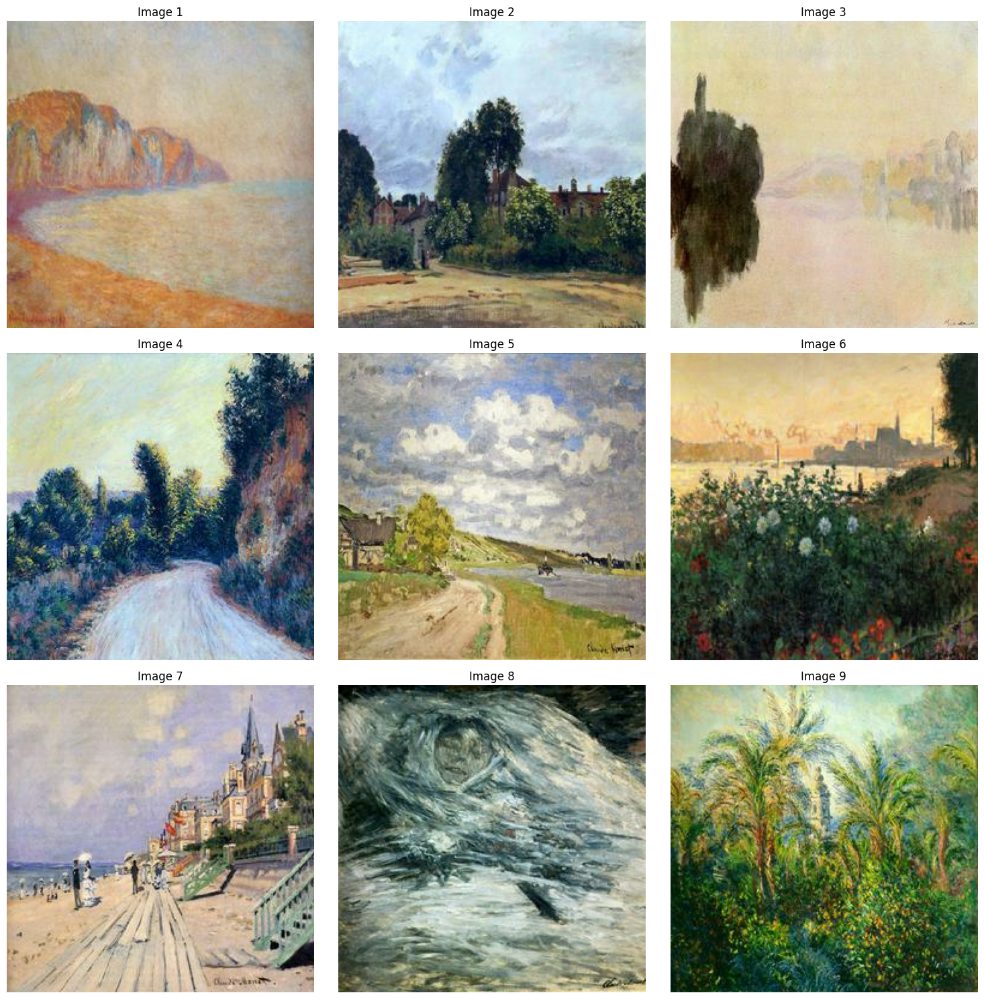

In [9]:
fig, axes = plt.subplots(
    nrows=3, ncols=3,
    figsize=(15, 15),    # square canvas
    dpi=100
)

axes = axes.flatten()
for ax, path in zip(axes, monet_jpgs[:9]):
    img = load_image(path)
    ax.imshow(((img + 1.0) / 2.0).numpy())
    ax.axis("off")
    ax.set_title(f"Image {monet_jpgs.index(path) + 1}")

plt.tight_layout()
plt.show()

Prints out the shape of the a sample Photo JPG.

In [10]:
sample_photo_jpg = load_image(photo_jpgs[0])
print(f"JPG shape: {sample_photo_jpg.shape}")

JPG shape: (256, 256, 3)


This code creates a 3×3 grid of 15×15-inch subplots at 100 DPI, then flattens the axes array so it can loop through the first nine Photo image paths. For each subplot, it loads and rescales the image tensor from [–1, 1] back to [0, 1] for display, hides the axis ticks, and titles it with its image number. Finally, it applies a tight layout to remove extra padding and renders the figure.

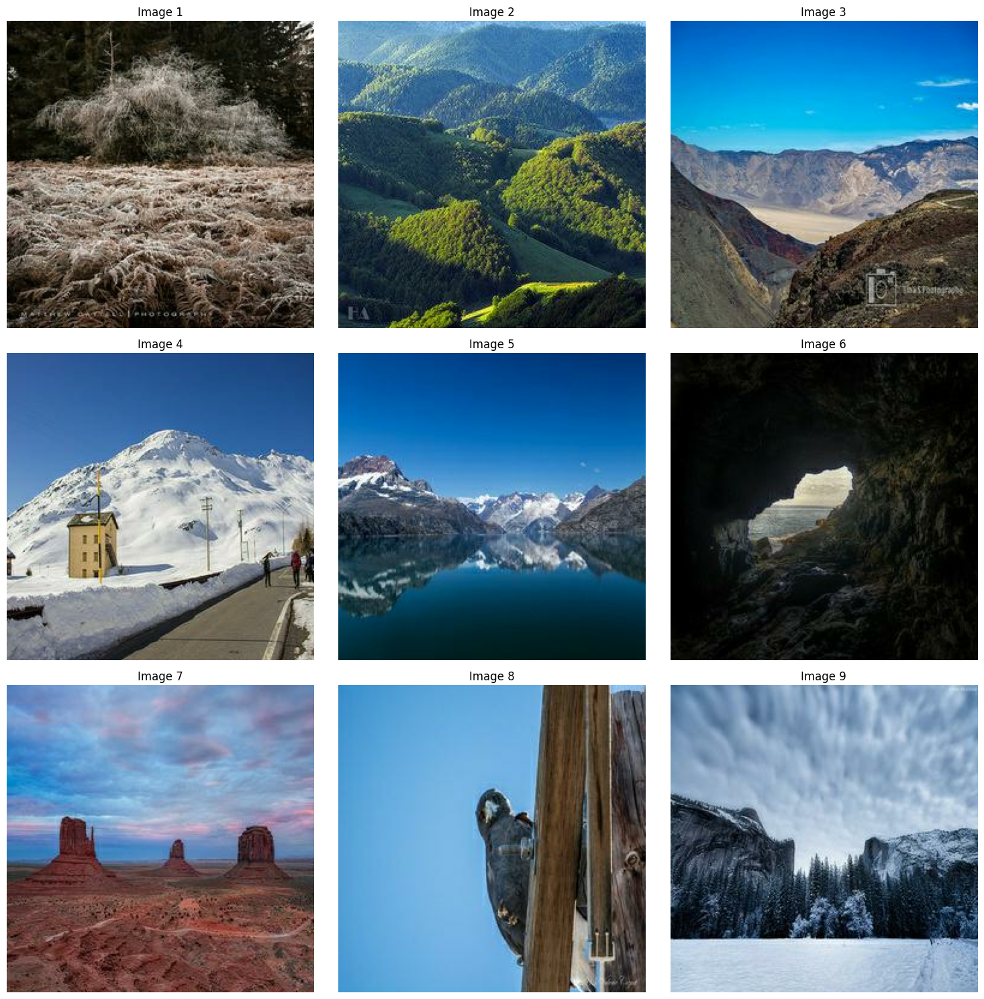

In [11]:
fig, axes = plt.subplots(
    nrows=3, ncols=3,
    figsize=(15, 15),    # square canvas
    dpi=100
)

axes = axes.flatten()
for ax, path in zip(axes, photo_jpgs[:9]):
    img = load_image(path)
    ax.imshow(((img + 1.0) / 2.0).numpy())
    ax.axis("off")
    ax.set_title(f"Image {photo_jpgs.index(path) + 1}")

plt.tight_layout()
plt.show()

### Model Buliding & Architecture

This defines a helper that turns a list of file paths into a fully-pipeline’d tf.data.Dataset: it slices the paths, maps load_image across them in parallel, shuffles the examples, groups them into batches of size BATCH_SIZE, and prefetches with AUTOTUNE for performance. Finally, it instantiates two datasets—monet_ds and photo_ds—from your Monet and photo image path lists.

In [12]:
def make_dataset(paths):
    ds = tf.data.Dataset.from_tensor_slices(paths)
    ds = ds.map(load_image, num_parallel_calls=AUTOTUNE)
    ds = ds.shuffle(len(paths)).batch(BATCH_SIZE).prefetch(AUTOTUNE)
    return ds

monet_ds = make_dataset(monet_jpgs)
photo_ds = make_dataset(photo_jpgs)

This function implements a single ResNet “skip” block: it takes an input tensor x, applies two 3×3 convolutions (without bias) each followed by batch normalization and a ReLU (after the first convolution), then adds the original tensor (init) back to the result, enabling the network to learn residual mappings and improving gradient flow during training.

In [13]:
def resnet_block(x, filters):
    init = x
    x = layers.Conv2D(filters, 3, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(filters, 3, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    return layers.add([init, x])

This function builds the CycleGAN generator as a Keras Model that:

* Accepts a 256×256×3 input and applies a 7×7 convolution (64 filters) with batch normalization and ReLU.

* Downsamples twice via 3×3 convolutions (128 then 256 filters) with stride 2, each followed by BN+ReLU.

* Processes features through nine ResNet blocks (each performing two 3×3 convs + BN + ReLU and a skip connection) at 256 channels.

* Upsamples back to 256×256 with two 3×3 transpose convolutions (128 then 64 filters), again with BN+ReLU.

* Outputs a 256×256×3 image via a final 7×7 convolution with tanh, producing pixel values in [–1, 1].

In [14]:
def build_generator():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = layers.Conv2D(64, 7, padding='same', use_bias=False)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    for f in [128, 256]:
        x = layers.Conv2D(f, 3, strides=2, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)

    for _ in range(9):
        x = resnet_block(x, 256)

    for f in [128, 64]:
        x = layers.Conv2DTranspose(f, 3, strides=2, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)

    x = layers.Conv2D(3, 7, padding='same', activation='tanh')(x)
    return tf.keras.Model(inputs, x, name="Generator")


Call the build_generator() function to build a generator for Photo2Monet and Monet2Photo

In [15]:
G_photo2monet = build_generator()
G_monet2photo = build_generator()

This defines the CycleGAN discriminator as a Keras Model that takes a 256×256×3 image input and applies a series of 4×4 convolutions with increasing filters (64→128→256→512), downsampling via strides of 2 (except the last block), each followed by a LeakyReLU activation (α=0.2). A final 4×4 convolution projects to a single-channel output map, yielding a “PatchGAN” score for each patch to distinguish real from generated patches.

In [16]:
def build_discriminator():
    inp = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = inp
    for f, stride in zip([64, 128, 256, 512], [2, 2, 2, 1]):
        x = layers.Conv2D(f, 4, strides=stride, padding='same')(x)
        x = layers.LeakyReLU(0.2)(x)
    x = layers.Conv2D(1, 4, padding='same')(x)
    return tf.keras.Model(inp, x, name="Discriminator")


Call the build_discriminator() function to build a discriminator for Monet and Photo images.

In [17]:
D_monet = build_discriminator()
D_photo = build_discriminator()

This code cell sets up the loss functions and optimizers in one go. Use MeanSquaredError for adversarial terms and MeanAbsoluteError for cycle-consistency and identity losses. The adversarial_loss pushes generated images’ predictions toward 1, while discriminator_loss averages the penalty for real (1) and fake (0) inputs. The cycle_loss measures absolute differences between originals and cycled images (scaled by LAMBDA_CYCLE), and identity_loss does the same for identity mappings (scaled by LAMBDA_ID). Finally, create Adam optimizers for both generator and discriminator using the learning rate (LR) and momentum term (BETA_1).

In [18]:
adv_loss_fn   = tf.keras.losses.MeanSquaredError()
cycle_loss_fn = tf.keras.losses.MeanAbsoluteError()

def adversarial_loss(real, pred):
    return adv_loss_fn(tf.ones_like(pred), pred)

def discriminator_loss(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return 0.5 * (real_loss + fake_loss)

def cycle_loss(real, cycled):
    return cycle_loss_fn(real, cycled) * LAMBDA_CYCLE

def identity_loss(real, same):
    return cycle_loss_fn(real, same) * LAMBDA_ID

gen_opt  = tf.keras.optimizers.Adam(LR,  BETA_1)
disc_opt = tf.keras.optimizers.Adam(LR,  BETA_1)


This snippet first creates two separate Adam optimizers—disc_monet_opt and disc_photo_opt—both using shared learning rate and momentum term. Then it defines a @tf.function-decorated train_step that, in one go, generates fake Monet and photo images, cycles them back, and computes the identity mappings; it evaluates all real and fake images with the respective discriminators, assembles the adversarial, cycle-consistency, and identity losses into a total generator loss, and computes discriminator losses. Finally, it takes gradients of those losses with respect to each network’s weights, applies the corresponding optimizer updates, and returns a dictionary of the generator and both discriminator losses for logging.

In [19]:
disc_monet_opt = tf.keras.optimizers.Adam(LR, beta_1=BETA_1)
disc_photo_opt = tf.keras.optimizers.Adam(LR, beta_1=BETA_1)

@tf.function
def train_step(real_monet, real_photo):
    with tf.GradientTape(persistent=True) as tape:
        fake_monet = G_photo2monet(real_photo, training=True)
        fake_photo = G_monet2photo(real_monet, training=True)

        cycled_photo = G_monet2photo(fake_monet, training=True)
        cycled_monet = G_photo2monet(fake_photo, training=True)

        same_photo = G_monet2photo(real_photo, training=True)
        same_monet = G_photo2monet(real_monet, training=True)

        disc_real_monet = D_monet(real_monet, training=True)
        disc_real_photo = D_photo(real_photo, training=True)
        disc_fake_monet = D_monet(fake_monet,  training=True)
        disc_fake_photo = D_photo(fake_photo,  training=True)

        gen_g_adv   = adversarial_loss(disc_fake_monet, disc_fake_monet)
        gen_f_adv   = adversarial_loss(disc_fake_photo, disc_fake_photo)
        total_cycle = cycle_loss(real_photo, cycled_photo) + cycle_loss(real_monet, cycled_monet)
        id_loss     = identity_loss(real_photo, same_photo) + identity_loss(real_monet, same_monet)
        G_loss      = gen_g_adv + gen_f_adv + total_cycle + id_loss

        D_monet_loss = discriminator_loss(disc_real_monet, disc_fake_monet)
        D_photo_loss = discriminator_loss(disc_real_photo, disc_fake_photo)

    grads_G = tape.gradient(G_loss, G_photo2monet.trainable_variables + G_monet2photo.trainable_variables)
    grads_D_m = tape.gradient(D_monet_loss, D_monet.trainable_variables)
    grads_D_p = tape.gradient(D_photo_loss, D_photo.trainable_variables)

    gen_opt.apply_gradients(zip(grads_G, G_photo2monet.trainable_variables + G_monet2photo.trainable_variables))
    disc_monet_opt.apply_gradients(zip(grads_D_m, D_monet.trainable_variables))
    disc_photo_opt.apply_gradients(zip(grads_D_p, D_photo.trainable_variables))

    return {
        "G_loss": G_loss,
        "D_monet_loss": D_monet_loss,
        "D_photo_loss": D_photo_loss
    }


This loop first pulls one batch of real photos to use as a fixed “example” input. It then runs through EPOCHS iterations, and in each epoch it zips together the Monet and photo datasets, calling train_step on every pair to update the generators and discriminators. After each epoch it prints out the formatted generator and discriminator losses along with the elapsed time. On the first epoch and every SAMPLE_INTERVALth epoch thereafter, it feeds that fixed photo batch through the photo→Monet generator (inference mode), rescales the outputs back to 0–255, arranges them in a 1×BATCH_SIZE subplot row, titles the figure with the epoch number, and saves it to the OUTPUT_DIR before closing the plot.

In [20]:
example_photo = next(iter(photo_ds))

for epoch in range(1, EPOCHS+1):
    start = time.time()
    for real_monet, real_photo in tf.data.Dataset.zip((monet_ds, photo_ds)):
        losses = train_step(real_monet, real_photo)
    print(f"Epoch {epoch:03d}/{EPOCHS}  "
          f"G_loss: {losses['G_loss']:.4f}  "
          f"D_m: {losses['D_monet_loss']:.4f}  "
          f"D_p: {losses['D_photo_loss']:.4f}  "
          f"Time: {time.time()-start:.1f}s")

    if epoch % SAMPLE_INTERVAL == 0 or epoch == 1:
        fake = G_photo2monet(example_photo, training=False)
        fake = (fake + 1) * 127.5
        fake = tf.cast(fake, tf.uint8).numpy()
        fig, axes = plt.subplots(1, BATCH_SIZE, figsize=(16,4))
        for i, ax in enumerate(axes):
            ax.imshow(fake[i])
            ax.axis('off')
        plt.suptitle(f"Photo→Monet at Epoch {epoch}")
        plt.savefig(os.path.join(OUTPUT_DIR, f"sample_epoch_{epoch:03d}.png"))
        plt.close()


2025-04-24 03:50:04.387298: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 90701
W0000 00:00:1745466604.505251    9228 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745466604.523071    9230 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745466604.523222    9230 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745466604.523498    9228 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745466604.523642    9228 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745466604.524025    9230 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745466604.524255    9228 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745466604.536822    9230 gpu_

Epoch 001/100  G_loss: 6.0448  D_m: 0.2998  D_p: 0.3196  Time: 27.6s


2025-04-24 03:50:33.951583: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 002/100  G_loss: 5.8431  D_m: 0.2030  D_p: 0.2605  Time: 12.4s
Epoch 003/100  G_loss: 5.8504  D_m: 0.2093  D_p: 0.2379  Time: 12.6s


2025-04-24 03:50:58.900336: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 004/100  G_loss: 5.8763  D_m: 0.2013  D_p: 0.2127  Time: 12.4s
Epoch 005/100  G_loss: 5.6920  D_m: 0.1953  D_p: 0.2013  Time: 12.5s
Epoch 006/100  G_loss: 7.7275  D_m: 0.2287  D_p: 0.2393  Time: 12.4s
Epoch 007/100  G_loss: 7.2662  D_m: 0.2477  D_p: 0.2125  Time: 12.5s


2025-04-24 03:51:48.919567: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 008/100  G_loss: 6.1344  D_m: 0.1886  D_p: 0.2263  Time: 12.6s
Epoch 009/100  G_loss: 4.7953  D_m: 0.1681  D_p: 0.1960  Time: 12.4s
Epoch 010/100  G_loss: 5.8340  D_m: 0.2156  D_p: 0.1781  Time: 12.5s
Epoch 011/100  G_loss: 5.4893  D_m: 0.1783  D_p: 0.1797  Time: 12.5s
Epoch 012/100  G_loss: 5.2920  D_m: 0.1285  D_p: 0.2634  Time: 12.4s
Epoch 013/100  G_loss: 5.8380  D_m: 0.1521  D_p: 0.1677  Time: 12.4s
Epoch 014/100  G_loss: 6.8224  D_m: 0.1483  D_p: 0.1742  Time: 12.3s
Epoch 015/100  G_loss: 8.2518  D_m: 0.1537  D_p: 0.1603  Time: 12.5s


2025-04-24 03:53:28.387480: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 016/100  G_loss: 4.8850  D_m: 0.1651  D_p: 0.2191  Time: 12.3s
Epoch 017/100  G_loss: 4.8921  D_m: 0.1376  D_p: 0.1487  Time: 12.5s
Epoch 018/100  G_loss: 5.0613  D_m: 0.1462  D_p: 0.2088  Time: 12.3s
Epoch 019/100  G_loss: 5.4913  D_m: 0.1480  D_p: 0.2308  Time: 12.4s
Epoch 020/100  G_loss: 5.5949  D_m: 0.1176  D_p: 0.1212  Time: 12.5s
Epoch 021/100  G_loss: 6.5777  D_m: 0.1840  D_p: 0.1753  Time: 12.3s
Epoch 022/100  G_loss: 4.6074  D_m: 0.1698  D_p: 0.1871  Time: 12.4s
Epoch 023/100  G_loss: 4.3979  D_m: 0.1305  D_p: 0.1537  Time: 12.3s
Epoch 024/100  G_loss: 5.0612  D_m: 0.1169  D_p: 0.1425  Time: 12.5s
Epoch 025/100  G_loss: 4.4402  D_m: 0.0912  D_p: 0.1594  Time: 12.4s
Epoch 026/100  G_loss: 5.1869  D_m: 0.0882  D_p: 0.1749  Time: 12.4s
Epoch 027/100  G_loss: 4.8052  D_m: 0.1075  D_p: 0.1175  Time: 12.5s
Epoch 028/100  G_loss: 4.9028  D_m: 0.0723  D_p: 0.1883  Time: 12.4s
Epoch 029/100  G_loss: 4.5312  D_m: 0.1759  D_p: 0.2087  Time: 12.6s
Epoch 030/100  G_loss: 4.6521  D_m

2025-04-24 03:56:47.553731: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 032/100  G_loss: 6.4013  D_m: 0.1021  D_p: 0.1443  Time: 12.5s
Epoch 033/100  G_loss: 6.1450  D_m: 0.1952  D_p: 0.1870  Time: 12.4s
Epoch 034/100  G_loss: 4.6477  D_m: 0.2107  D_p: 0.1391  Time: 12.6s
Epoch 035/100  G_loss: 4.4034  D_m: 0.1099  D_p: 0.1128  Time: 12.4s
Epoch 036/100  G_loss: 5.1442  D_m: 0.1213  D_p: 0.1368  Time: 20.5s
Epoch 037/100  G_loss: 6.2595  D_m: 0.1031  D_p: 0.0942  Time: 12.3s
Epoch 038/100  G_loss: 6.2160  D_m: 0.1163  D_p: 0.1362  Time: 12.5s
Epoch 039/100  G_loss: 5.0497  D_m: 0.1181  D_p: 0.1248  Time: 12.4s
Epoch 040/100  G_loss: 4.5697  D_m: 0.0771  D_p: 0.1818  Time: 12.4s
Epoch 041/100  G_loss: 4.6468  D_m: 0.1082  D_p: 0.1371  Time: 12.5s
Epoch 042/100  G_loss: 3.8551  D_m: 0.0918  D_p: 0.1535  Time: 12.3s
Epoch 043/100  G_loss: 4.4958  D_m: 0.1400  D_p: 0.1186  Time: 12.5s
Epoch 044/100  G_loss: 4.7556  D_m: 0.0757  D_p: 0.1983  Time: 12.3s
Epoch 045/100  G_loss: 4.7426  D_m: 0.1365  D_p: 0.1373  Time: 12.5s
Epoch 046/100  G_loss: 4.2035  D_m

2025-04-24 04:03:33.775131: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 064/100  G_loss: 4.1244  D_m: 0.1281  D_p: 0.2403  Time: 12.5s
Epoch 065/100  G_loss: 4.0954  D_m: 0.1496  D_p: 0.1405  Time: 12.5s
Epoch 066/100  G_loss: 3.9425  D_m: 0.1892  D_p: 0.1937  Time: 12.3s
Epoch 067/100  G_loss: 4.7198  D_m: 0.1019  D_p: 0.1160  Time: 12.5s
Epoch 068/100  G_loss: 3.7887  D_m: 0.1126  D_p: 0.1520  Time: 12.3s
Epoch 069/100  G_loss: 5.0482  D_m: 0.1763  D_p: 0.2026  Time: 12.4s
Epoch 070/100  G_loss: 4.7167  D_m: 0.1890  D_p: 0.2428  Time: 12.4s
Epoch 071/100  G_loss: 4.0714  D_m: 0.2256  D_p: 0.1817  Time: 12.4s
Epoch 072/100  G_loss: 5.0807  D_m: 0.1253  D_p: 0.2251  Time: 12.5s
Epoch 073/100  G_loss: 4.5828  D_m: 0.1556  D_p: 0.1943  Time: 12.3s
Epoch 074/100  G_loss: 3.5430  D_m: 0.1817  D_p: 0.1945  Time: 12.5s
Epoch 075/100  G_loss: 3.9404  D_m: 0.1403  D_p: 0.2448  Time: 12.4s
Epoch 076/100  G_loss: 4.5135  D_m: 0.0986  D_p: 0.1122  Time: 12.4s
Epoch 077/100  G_loss: 4.0981  D_m: 0.2319  D_p: 0.2348  Time: 12.5s
Epoch 078/100  G_loss: 3.9483  D_m

This snippet creates a “submission_images” folder inside current output directory, then gathers and sorts all input photo paths. It loops over the first 10,000 images, loads and batches each one, runs it through the photo→Monet generator in inference mode, rescales the resulting tensor back to 0–255 uint8 pixel values, and saves each output as a zero-padded JPEG in the submission directory. Finally, it prints how many images were written.

In [21]:

SUB_DIR = os.path.join(OUTPUT_DIR, "submission_images")
os.makedirs(SUB_DIR, exist_ok=True)
photo_paths = sorted(glob.glob(f"{photo_jpg_dir}/*.jpg"))

for i, path in enumerate(photo_paths[:10000]):
    img = load_image(path)[tf.newaxis,...]
    monet_img = G_photo2monet(img, training=False)[0]
    monet_img = ((monet_img + 1) * 127.5).numpy().astype(np.uint8)
    Image.fromarray(monet_img).save(f"{SUB_DIR}/{i:05d}.jpg")

print(f"Saved {min(len(photo_paths),10000)} images to {SUB_DIR}")

W0000 00:00:1745467861.668565    9150 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745467861.668701    9150 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745467861.668877    9150 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745467861.669028    9150 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745467861.669187    9150 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745467861.669389    9150 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745467861.669602    9150 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745467861.670022    9150 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1745467861.670503    9150 gp

Saved 7038 images to cyclegan_output/submission_images


This code defines the source directory for the generated images and a target ZIP file path, then opens a new ZIP in write mode with DEFLATED compression. It walks through every file under submission_images, adds each JPEG to the archive using a relative path (so the ZIP is flat), and finally prints the path to the completed ZIP.

In [22]:
src_folder = os.path.join(os.getcwd(), "cyclegan_output/submission_images")
zip_path = os.path.join(os.getcwd(), "generated/images.zip")

with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as z:
    for root, _, files in os.walk(src_folder):
        for fname in files:
            full_path = os.path.join(root, fname)
            arcname = os.path.relpath(full_path, src_folder)
            z.write(full_path, arcname=arcname)

print("Done—created", zip_path)

Done—created /workspace/generated/images.zip


This code creates a 3×3 grid of 15×15-inch subplots at 100 DPI, then flattens the axes array so it can loop through the first nine Images to Monte images. For each subplot, it loads and rescales the image tensor from [–1, 1] back to [0, 1] for display, hides the axis ticks, and titles it with its image number. Finally, it applies a tight layout to remove extra padding and renders the figure.

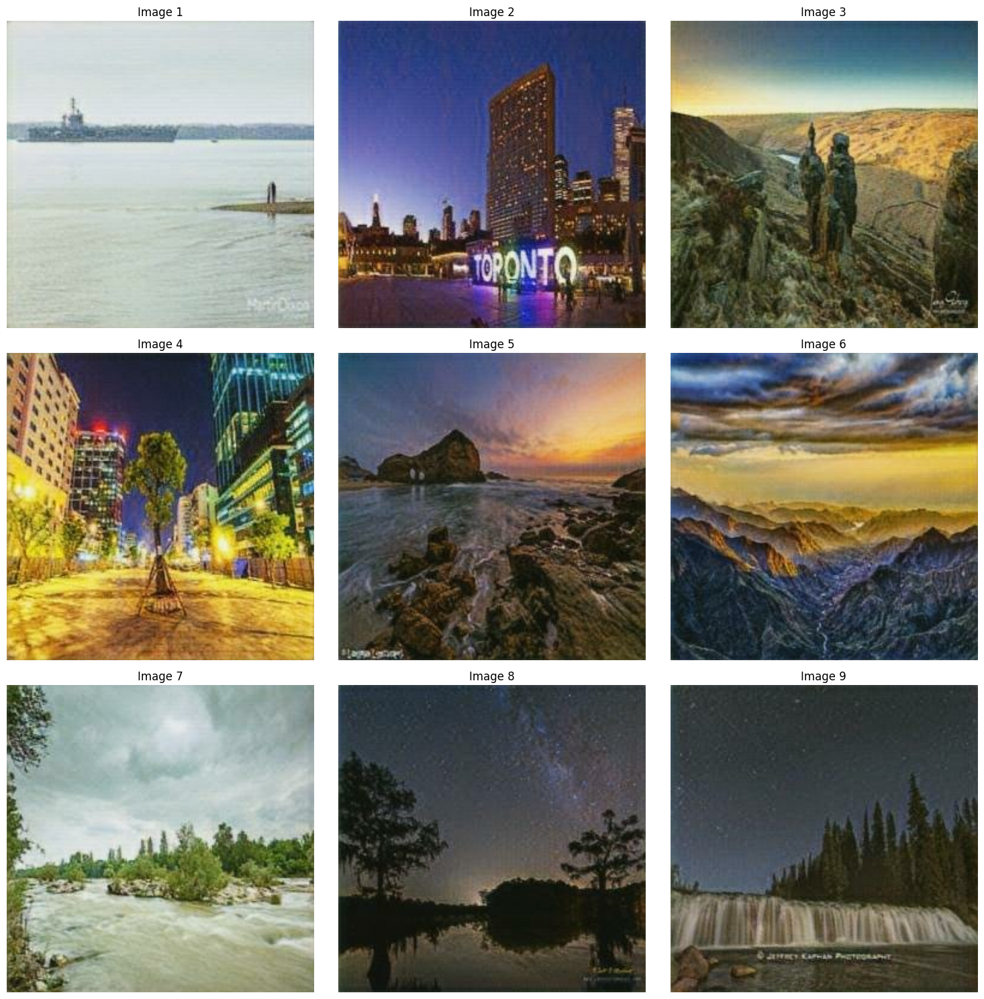

In [23]:
submission_jpgs = [os.path.join(src_folder, jpg) for jpg in os.listdir(src_folder)]

fig, axes = plt.subplots(
    nrows=3, ncols=3,
    figsize=(15, 15),
    dpi=100
)

axes = axes.flatten()
for ax, path in zip(axes, submission_jpgs[:9]):
    img = load_image(path)
    ax.imshow(((img + 1.0) / 2.0).numpy())
    ax.axis("off")
    ax.set_title(f"Image {submission_jpgs.index(path) + 1}")

plt.tight_layout()
plt.show()


### Conclusion

In this project, I built and trained a CycleGAN to translate between two image domains—photos and Monet-style paintings—by defining modular data pipelines, generator and discriminator architectures, and a combined adversarial plus cycle-consistency loss. I set up efficient input handling with tf.data and AUTOTUNE, applied residual blocks in your generator for stable feature learning, and used a PatchGAN discriminator to focus on local texture realism. During training, I monitored both adversarial and cycle losses, periodically visualized sample translations, and ultimately generated a set of stylized images for submission. This end-to-end workflow—from preprocessing and model design to inference and packaging—demonstrates how CycleGANs can learn complex style mappings without paired data, and provides a solid foundation for further experimentation with loss weights, network depth, or alternative normalization strategies to enhance output quality.


### Refrences

1. [Amy Jang CycleGAN Tutorial](https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial)
2. [Geeksforgeeks GAN Tutorial](https://www.geeksforgeeks.org/generative-adversarial-network-gan/)
3. [Tensorflow Docs](https://www.tensorflow.org/api_docs/python/tf/all_symbols)
4. [Keras API Docs](https://keras.io/api/)